# Data Exploration

This repository enables the segmentation of nuclei in H&E whole-slide images (WSIs). For inference, we have incorporated two modes:

- Tile processing mode
- WSI processing mode

For tile processing, the input must be in a standard image format, such as `.jpg` or `.png`. <br />
For WSI processing, the input must be an [OpenSlide](https://openslide.org/) supported whole-slide image.

- Both tile and wsi processing modes output a `.json` file that contains:
        - bounding box coordinates for each nucleus
        - centroid coordinates for each nucleus
        - contour coordinates for each nucleus 
        - nucleus type predictions
        - per class probabilities for each nucleus (optional)
- tile mode also output a `.mat` and overlay file. The `.mat` file contains:
        - raw output of network (optional)
        - instance map containing values from 0 to N, where N is the number of nuclei
        - list of length N containing predictions for each nucleus
- wsi mode also produces a low resolution thumbnail and a tissue mask

In this notebook, we demonstrate how to utilise the output generated by these two different settings.

## Imports

In [1]:
# load the libraries

import sys
sys.path.append('../')

import numpy as np
import os
import pandas as pd
# import glob
import matplotlib.pyplot as plt
import scipy.io as sio
import cv2
# import json
import random
# import torch
from matplotlib.lines import Line2D
from collections import Counter
import seaborn as sns
import itertools
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, make_scorer, accuracy_score, get_scorer, f1_score
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

import helper_functions as hf

## Lizard Dataset Description
We observe that the values range from 0 (background) to N where N is the number of classes. See below what these values refer to for different datasets


1) Neutrophil <br />
2) Epithelial <br />
3) Lymphocyte <br />
4) Plasma <br />
5) Eosinophil <br />
6) Connective


**In this example we use a checkpoint trained on the Lizard dataset**

instance map shape (1516, 1512)
number of instances 4317
number of type predictions 5
Number of instance from each type:
1.- Neutrophil: 0 (0.00%)
2.- Epithelial: 2317 (53.67%)
3.- Lymphocyte: 560 (12.97%)
4.- Plasma: 166 (3.85%)
5.- Eosinophil: 43 (1.00%)
6.- Connective: 1231 (28.52%)


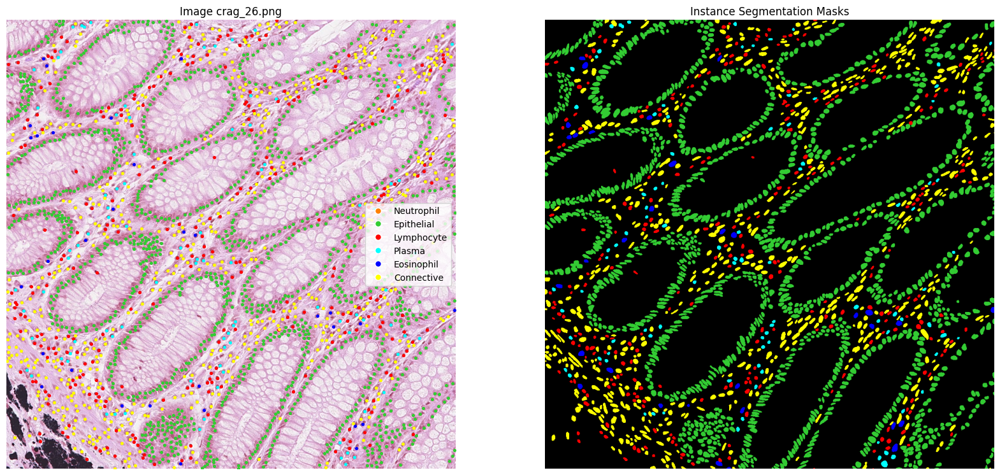

In [389]:
# plot the original image, along with the instance map and the overlay
images = [f.path for f in os.scandir('/storage/homefs/jg23p152/project/Data/Lizard/tiles_healthy') if f.path.endswith('.png')]
img_file = images[random.randint(0, len(images)-1)]
hf.show_tile_labeled(img_file, 1000)

# EDA
In this section, we will show some information regarding the overall dataset:
- Cell type counts in benign vs malignant regions
- Color Analysis
    - between benign and malignant
    - between cohorts in training set: glas, dpath, crag
    - between cohorts in test set: PanNuke only because TCGA lacks masks

In [8]:
df = hf.build_df('/storage/homefs/jg23p152/project/Data/Lizard/', labels_folder='Labels')

df.head()
mal = df[df.malignant==1].reset_index(drop=True)
ben = df[df.malignant==0].reset_index(drop=True)

In [2]:
df_test = hf.build_df('/storage/homefs/jg23p152/project/Data/Test/PanNuke', labels_folder='coordinates')
df_test.head()

,file,cohort,img_dim_x,img_dim_y,malignant,total_count,neut_count,epit_count,lymp_count,plas_count,eosi_count,conn_count
0,/storage/homefs/jg23p152/project/Data/Test/Pan...,pannuke,500,500,0,433,0.002309,0.422633,0.145497,0.057737,0.006928,0.364896
1,/storage/homefs/jg23p152/project/Data/Test/Pan...,pannuke,500,500,0,318,0.000000,0.713836,0.050314,0.000000,0.000000,0.235849
2,/storage/homefs/jg23p152/project/Data/Test/Pan...,pannuke,500,500,0,456,0.000000,0.885965,0.046053,0.002193,0.000000,0.065789
3,/storage/homefs/jg23p152/project/Data/Test/Pan...,pannuke,512,512,0,857,0.001167,0.526254,0.140023,0.246208,0.000000,0.086348
4,/storage/homefs/jg23p152/project/Data/Test/Pan...,pannuke,337,512,0,619,0.000000,0.607431,0.163166,0.127625,0.008078,0.093700


In [11]:
ben.iloc[:,2:].describe()
# mal: 1058.062500	1187.781250	1.0	1777.552083	0.012318	0.633363	0.092919	0.018755	0.002563	0.240081
# ben: 1070.807692	1205.250000	0.0	2482.019231	0.001231	0.446101	0.247037	0.086723	0.007513	0.211394

,img_dim_x,img_dim_y,malignant,total_count,neut_count,epit_count,lymp_count,plas_count,eosi_count,conn_count
count,52.000000,52.000000,52.0,52.000000,52.000000,52.000000,52.000000,52.000000,52.000000,52.000000
mean,1070.807692,1205.250000,0.0,2482.019231,0.001231,0.446101,0.247037,0.086723,0.007513,0.211394
std,414.817987,317.359997,0.0,1610.658330,0.002109,0.118789,0.116065,0.046905,0.008327,0.095706
min,453.000000,589.000000,0.0,542.000000,0.000000,0.186184,0.059797,0.021852,0.000000,0.103708
25%,610.500000,931.750000,0.0,1303.250000,0.000000,0.336924,0.181302,0.055596,0.001559,0.156500
50%,1105.000000,1249.000000,0.0,1997.000000,0.000729,0.463672,0.225140,0.075011,0.004487,0.188155
75%,1516.000000,1511.000000,0.0,3256.750000,0.001208,0.541418,0.281503,0.114678,0.010716,0.227540
max,1516.000000,1684.000000,0.0,7283.000000,0.011570,0.664207,0.567251,0.235569,0.038443,0.546575


## Count Analysis 

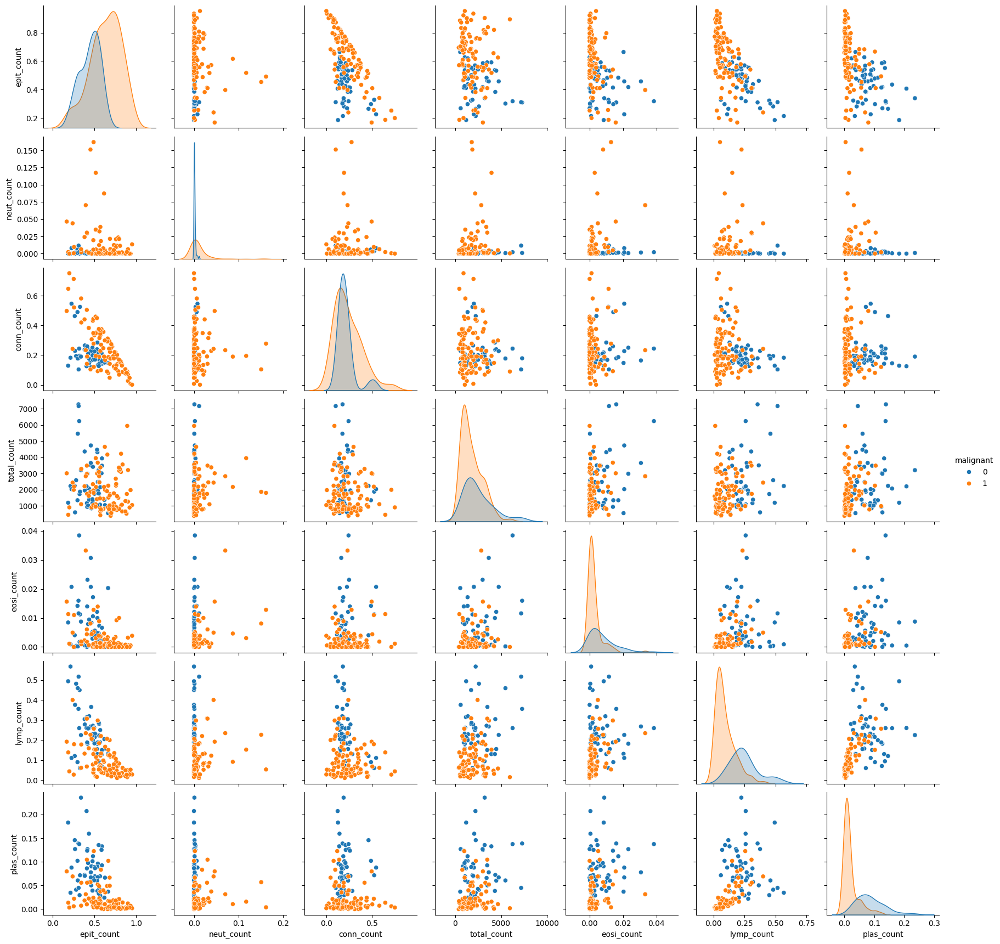

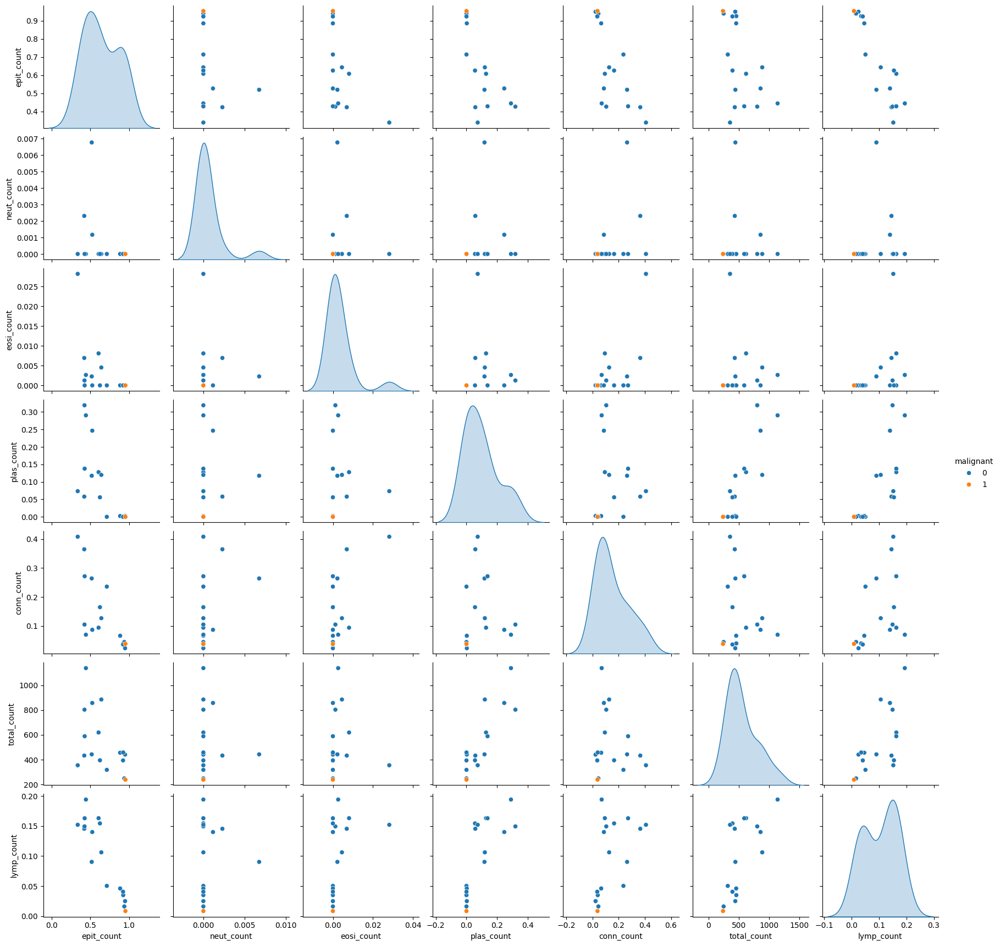

In [20]:
hf.pairplot(df.iloc[:,4:])
# plt.title('Distribution Training Set')

# This shows that:
# 1. malignancy leads to proliferation of epithelial cells
# 2. lymphocytes and plasma cell count is reduced, supported by 10.1080/2162402X.2018.1537693

hf.pairplot(df_test.iloc[:,4:])
# plt.title('Distribution Test Set')



instance map shape (1516, 1509)
number of instances 899
number of type predictions 5
Number of instance from each type:
1.- Neutrophil: 0 (0.00%)
2.- Epithelial: 180 (20.02%)
3.- Lymphocyte: 39 (4.34%)
4.- Plasma: 3 (0.33%)
5.- Eosinophil: 1 (0.11%)
6.- Connective: 676 (75.19%)


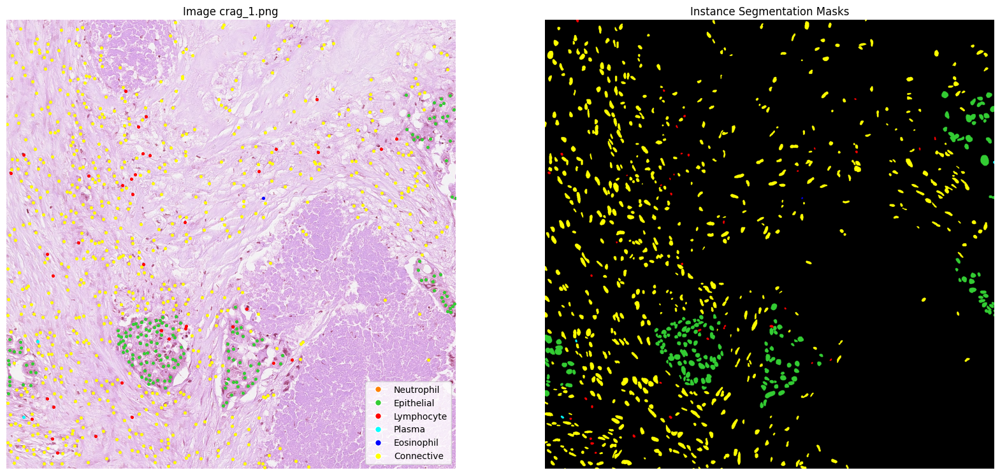

In [ ]:
idx = list(mal.conn_count).index(max(mal.conn_count))
hf.show_tile_labeled(mal.iloc[idx,0], 1500)

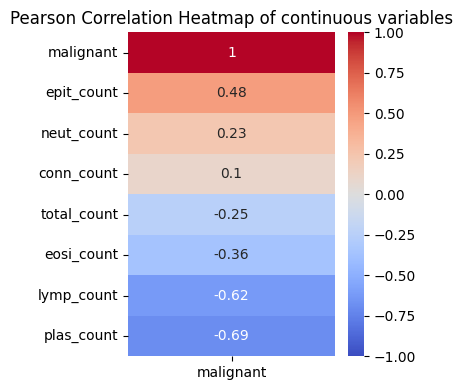

,malignant
malignant,1.000000
epit_count,0.482697
neut_count,0.228559
conn_count,0.100980
total_count,-0.249512
eosi_count,-0.360963
lymp_count,-0.622784
plas_count,-0.690749


In [ ]:
hf.pearson_correlation(df.iloc[:,4:], plot_heatmap=True)

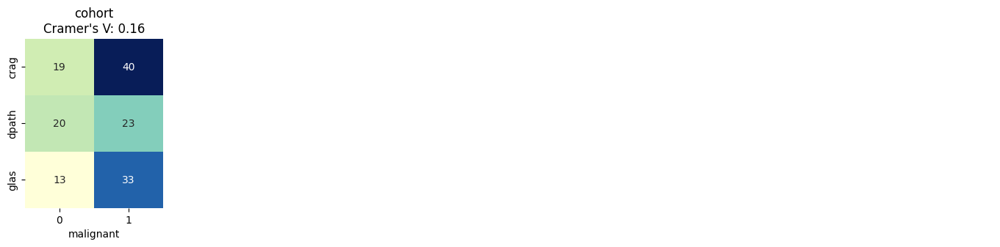

In [ ]:
hf.plot_contingency(df.iloc[:,1:])

## Color Analysis Tile Level
Will start by first incorporating features about the color of the tile (mean and std)

In [21]:
# df = pd.read_csv('/storage/homefs/jg23p152/project/hover_net/examples/data_info.csv', index_col=0)
name = ['tile']
cell_feat = ['r', 'g', 'b']
feat_stats = ['mean', 'std'] 
feat_names = [f'{name}_{feat}_{stat}' for name, feat, stat in itertools.product(name, cell_feat, feat_stats)]
df_test[feat_names] = None

In [3]:
# df = pd.read_csv('/storage/homefs/jg23p152/project/hover_net/examples/data_info.csv',ignore_index=True)

# Now we add the:

cell_feat = ['r', 'g', 'b']
feat_stats = ['mean', 'std'] 

for i in range(len(df_test)):

    name = 'tile'
    mean, std = hf.get_mean_image(df_test.loc[i,'file'], ignore_white=True)
    desc = pd.DataFrame(index=['mean', 'std'] , columns=['r','g','b'], data=np.array([mean, std]))

    for feat, stat in itertools.product(cell_feat, feat_stats):
        df_test.loc[i,'_'.join([name,feat,stat])] = desc.loc[stat,feat]

### Histograms by cohort

training set

Text(0.5, 1.0, 'Mean color')

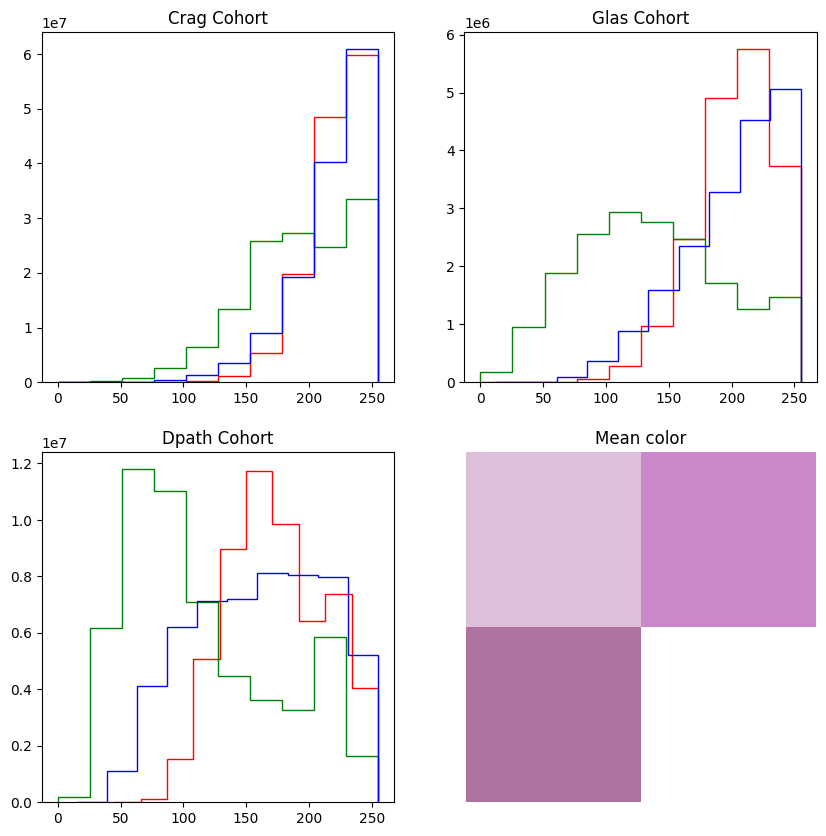

In [ ]:
ims_crag = []
ims_dpath = []
ims_glas = []
for path, subdirs, files in os.walk('/storage/homefs/jg23p152/project/Data'):
      for name in files:
            if ".png" in name and 'crag' in name:
                  ims_crag.append(os.path.join(path, name))
            elif ".png" in name and 'dpath' in name:
                  ims_dpath.append(os.path.join(path, name))
            elif ".png" in name and 'glas' in name:
                  ims_glas.append(os.path.join(path, name))


avg = np.ones((2,2,3))

fig, ax = plt.subplots(2,2, figsize=(10,10))

crag_val = hf.dataset_histogram(ims_crag, ax[0,0], get_mean=True)
ax[0,0].set_title('Crag Cohort')

glas_val = hf.dataset_histogram(ims_glas, ax[0,1], get_mean=True)
ax[0,1].set_title('Glas Cohort')

dpath_val = hf.dataset_histogram(ims_dpath, ax[1,0], get_mean=True)
ax[1,0].set_title('Dpath Cohort')

avg[0,0,:] = crag_val
avg[0,1,:] = glas_val
avg[1,0,:] = dpath_val

ax[1,1].imshow(avg)
ax[1,1].axis('off')
ax[1,1].set_title('Mean color')

test set

Text(0.5, 1.0, 'Mean color')

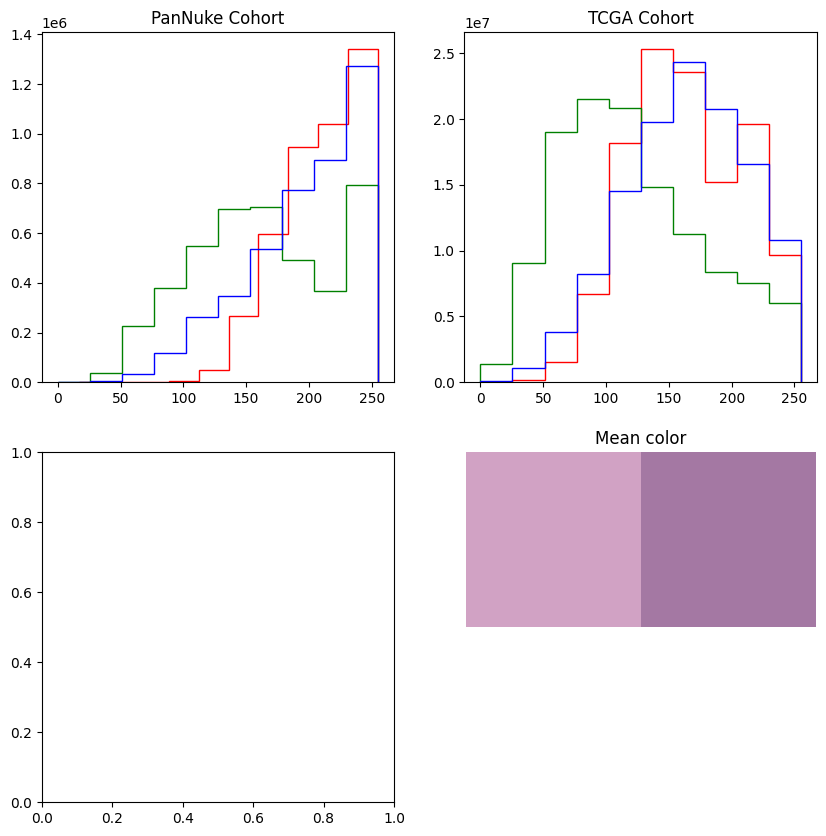

In [24]:
ims_pan = []
ims_tcga = []
for path, subdirs, files in os.walk('/storage/homefs/jg23p152/project/Data/Test'):
      for name in files:
            if ".png" in name and 'pannuke' in name:
                  ims_pan.append(os.path.join(path, name))
            elif ".tif" in name and 'TCGA' in name:
                  ims_tcga.append(os.path.join(path, name))

avg = np.ones((2,2,3))

fig, ax = plt.subplots(2,2, figsize=(10,10))

pan_val = hf.dataset_histogram(ims_pan, ax[0,0], get_mean=True)
ax[0,0].set_title('PanNuke Cohort')

tcga_val = hf.dataset_histogram(ims_tcga, ax[0,1], get_mean=True)
ax[0,1].set_title('TCGA Cohort')

avg[0,0,:] = pan_val
avg[0,1,:] = tcga_val

ax[1,1].imshow(avg)
ax[1,1].axis('off')
ax[1,1].set_title('Mean color')

### Histograms by class

Text(0.5, 1.0, 'Mean color')

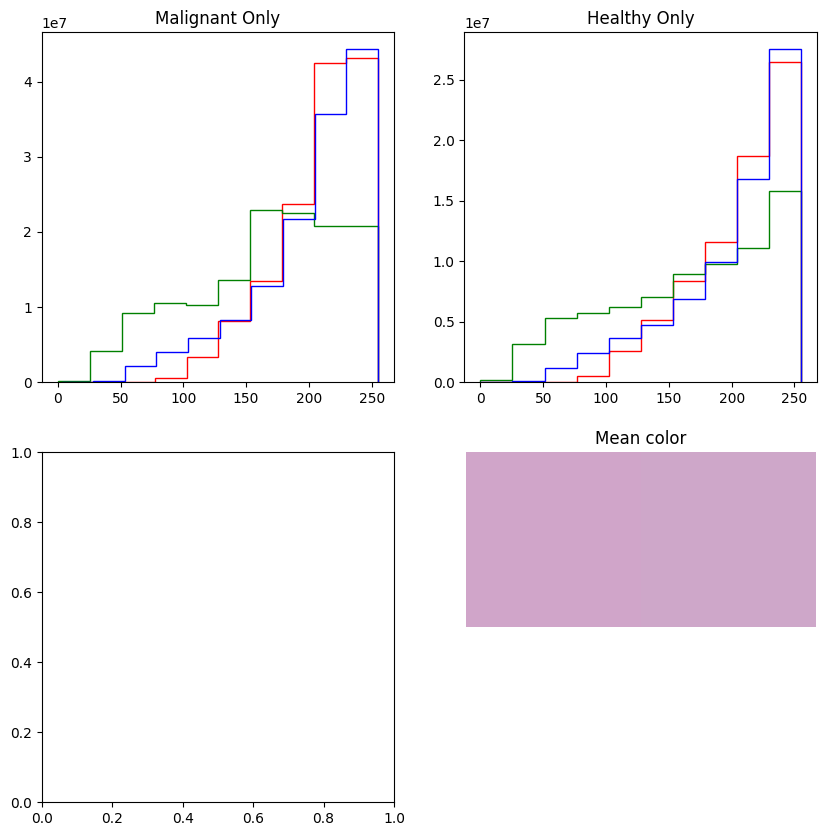

In [ ]:
ims_mal = []
ims_ben = []

for path, subdirs, files in os.walk('/storage/homefs/jg23p152/project/Data'):
      for name in files:
            if ".png" in name and 'healthy' in path:
                  ims_ben.append(os.path.join(path, name))
            elif ".png" in name and 'malignant' in path:
                  ims_mal.append(os.path.join(path, name))

fig, ax = plt.subplots(2,2, figsize=(10,10))

mal_val = hf.dataset_histogram(ims_mal, ax[0,0], get_mean=True)
ax[0,0].set_title('Malignant Only')

ben_val = hf.dataset_histogram(ims_ben, ax[0,1], get_mean=True)
ax[0,1].set_title('Healthy Only')

avg = np.ones((2,2,3))
avg[0,0,:] = mal_val
avg[0,1,:] = ben_val
ax[1,1].imshow(avg)
ax[1,1].axis('off')
ax[1,1].set_title('Mean color')

## Color Analysis Instance Level
Includes features relating to the color of each cell type in the RGB channels (mean and std)

glas


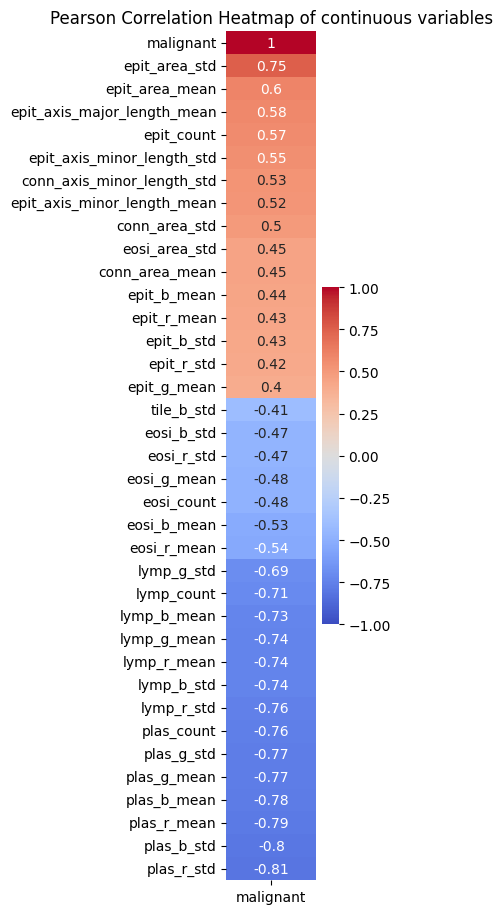

crag


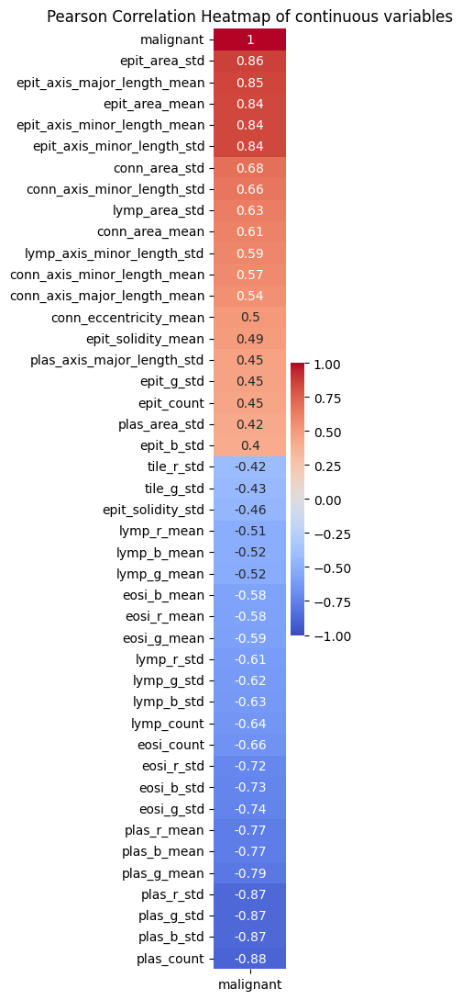

dpath


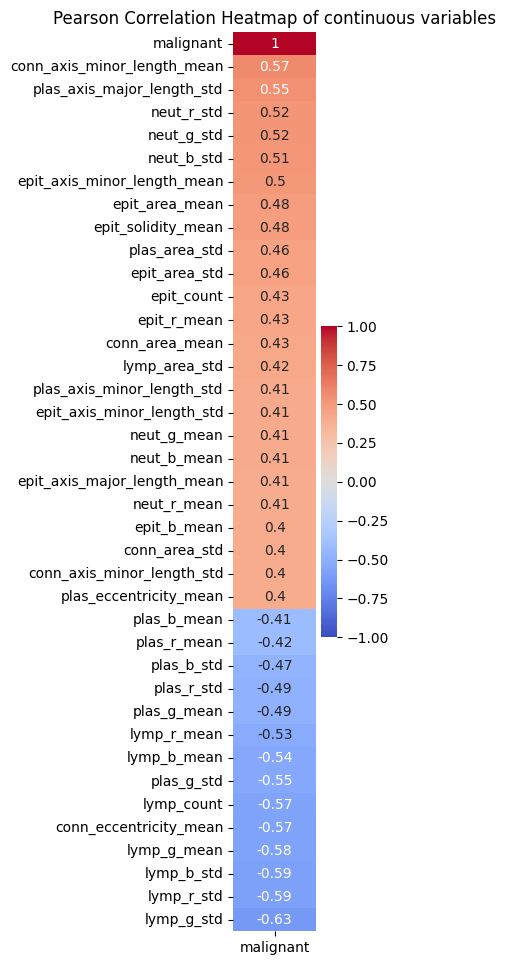

In [6]:
# FOR TRAINING SET
df = pd.read_csv('/storage/homefs/jg23p152/project/Data/data_info_slide_level.csv', index_col=0).drop(columns='tile_id')
df_test = pd.read_csv('/storage/homefs/jg23p152/project/Data/data_pannuke_info_slide_level.csv', index_col=0)
df_test = df_test[df.columns]
corrs = []

for cohort in df.cohort.unique():
    df_aux = df[df.cohort==cohort]
    print(cohort)
    __, corr = hf.pearson_correlation(df_aux.iloc[:,4:], plot_heatmap=True, target='malignant',num_only=False, high_only=True)
    corrs.append(corr.index.tolist())

if we use labels in **coordinates_mat**:
- inst_type.shape = (1,1012)
- np.unique(inst_type) = [0]
- inst_centroid.shape = (1012, 2)

if we use labels in **coordinates_mat_all**:
- inst_type.shape = (1,1886)
- np.unique(inst_type) = [0]
- inst_centroid.shape = (1886, 2)
    

dict_keys(['__header__', '__version__', '__globals__', 'inst_type', 'inst_centroid'])
(715, 2)


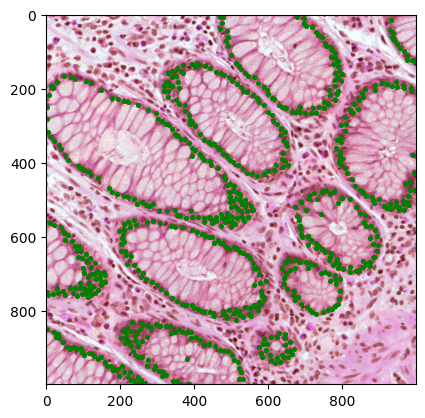

In [42]:
from scipy import io as sio
im = '/storage/homefs/jg23p152/project/Data/Test/TCGA/images/TCGA-AG-A00Y-01Z-00-DX1.E98EC504-95CA-4C34-924C-D40ADF323617.svs_r2_x_22659_y_94734.tif'
result_map = hf.get_result_mat_from_img(im, 'coordinates_mat')
result_map = sio.loadmat(result_map)
print(result_map.keys())
centroids = result_map['inst_centroid'].astype(int)
print(centroids.shape)

im = cv2.imread(im)
plt.imshow(im)
for i in range(len(centroids)):
    plt.scatter(x=centroids[i,0], y=centroids[i,1], color='g', s=7)



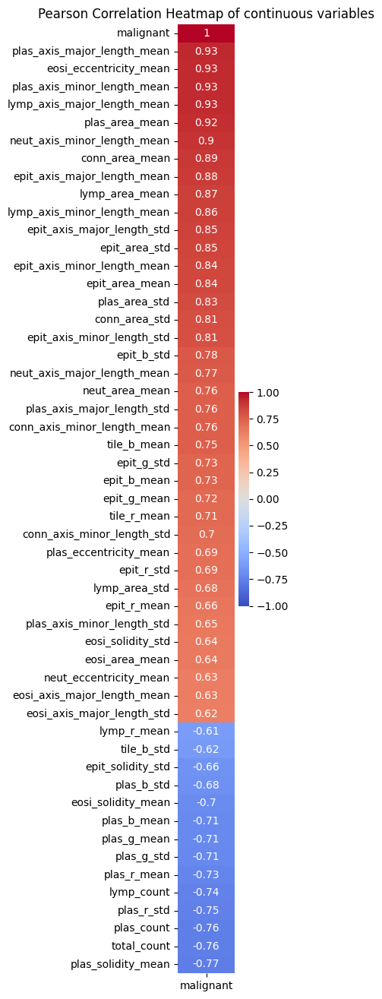

In [5]:
# FOR TEST SET
__, corr = hf.pearson_correlation(df_test.iloc[:,4:], plot_heatmap=True, target='malignant',num_only=False, high_only=True, threshold=0.6)

In [7]:
same = list(set(corrs[0]).intersection(*corrs))
reduced = df[same]
reduced_test = df_test[same]

/tmp/ipykernel_39502/3044336485.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  reduced['cohort'] = cohorts


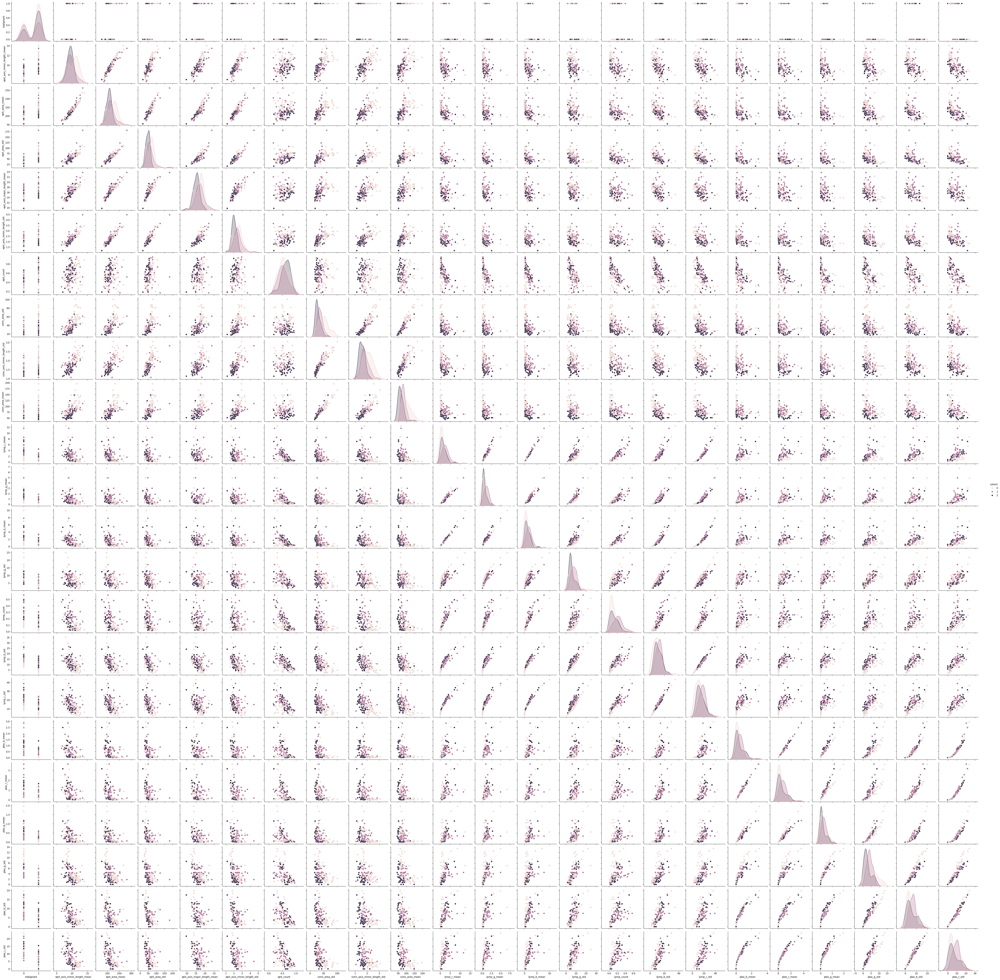

In [ ]:
cohorts = {c:i for i, c in enumerate(sorted(df.cohort.unique()))}
cohorts = [cohorts[c] for c in df.cohort]
reduced = df[same]
reduced['cohort'] = cohorts
hf.pairplot(reduced, target='cohort')

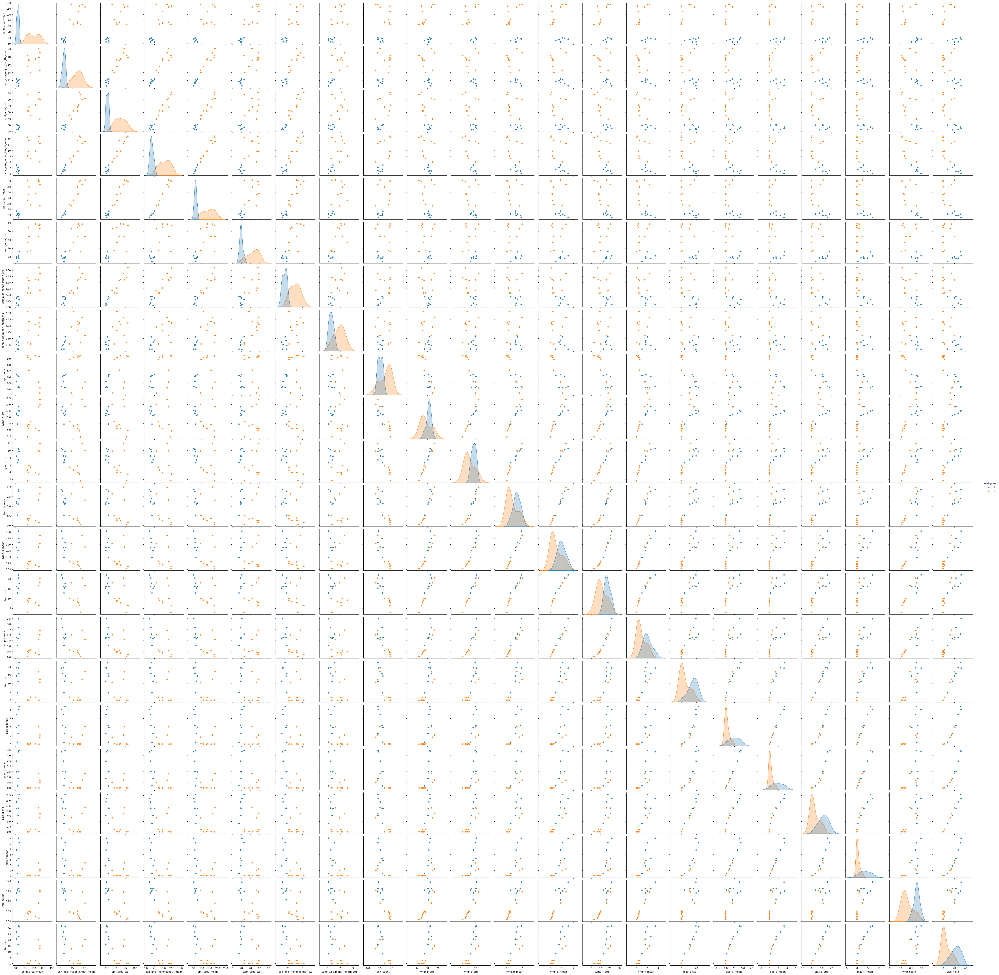

In [8]:
hf.pairplot(reduced)
hf.pairplot(reduced_test)

In [4]:
# # Now we add the cell type color features:
# from skimage import measure
# cell_feat = ['r', 'g', 'b']
# morph_feat = ['area', 'eccentricity', 'solidity', 'axis_major_length', 'axis_minor_length']
# feat_stats = ['mean', 'std'] 
# folder = 'coordinates'

# for i in range(len(df_test)):
#     result_map = hf.load_result_mat(df_test.loc[i,'file'], folder)
#     inst_map = result_map["inst_map"]
#     image = cv2.imread(df_test.loc[i,'file'])

    
    
#     for j in hf.legend_short.keys():
#         nuclei = image * np.repeat((hf.inst_to_class(inst_map, result_map["class"])==j)[...,None], 3, axis=2)
#         desc = pd.DataFrame(index=['mean', 'std'] , columns=['r','g','b'], data=np.array([nuclei.mean(axis=(0,1)),nuclei.std(axis=(0,1))]))
#         name = hf.legend_short[j][:4].lower()

#         inst_map_type = inst_map * (hf.inst_to_class(inst_map, result_map["class"])==j)

#         props = pd.DataFrame(measure.regionprops_table(inst_map_type, properties=morph_feat)).describe()

#         for feat, stat in itertools.product(cell_feat, feat_stats):
#             df_test.loc[i,'_'.join([name,feat,stat])] = desc.loc[stat,feat]

#         for feat, stat in itertools.product(morph_feat, feat_stats):
#             df_test.loc[i,'_'.join([name,feat,stat])] = props.loc[stat,feat]       

/tmp/ipykernel_39728/971594701.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_test.loc[i,'_'.join([name,feat,stat])] = desc.loc[stat,feat]
/tmp/ipykernel_39728/971594701.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_test.loc[i,'_'.join([name,feat,stat])] = desc.loc[stat,feat]
/tmp/ipykernel_39728/971594701.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(

In [ ]:
ben = df[df['malignant']==0]
mal = df[df['malignant']==1]

In [ ]:
cols = ['malignant']
# cols = []
cell_feat = ['g']
feat_stats = ['mean', 'std'] 
for j in legend.keys():
    name = legend[j][:4].lower()
    for feat, stat in itertools.product(cell_feat, feat_stats):
        cols.append('_'.join([name,feat,stat]))
# pairplot(df, target='malignant', features=cols)

## Classification Model with Interpretability
Can a simple linear model learn which tiles are malignant and which are healthy based on the extracted features?

In [9]:
cols_remove = ['file', 'img_dim_x', 'img_dim_y']

df_train = df.drop(columns=cols_remove)
df_test = df_test.drop(columns=cols_remove) if cols_remove[0] in df_test.columns else df_test

# cohorts = {c:i for i, c in enumerate(sorted(df.cohort.unique())+sorted(df_test.cohort.unique()))}

# cohorts = [cohorts[c] for c in df.cohort]
# df_train['cohort'] = cohorts

target = 'malignant'
ignore = 'cohort'

df_train = df_train.drop(columns=[ignore])
df_test = df_test.drop(columns=[ignore]) if ignore in df_test.columns else df_test
df_train, df_val = train_test_split(df_train, test_size=0.2, random_state=42, stratify=df_train[target], shuffle=True)


/storage/homefs/jg23p152/.conda/envs/hovernet/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


COEFFICIENTS OBTAINED BY THE LOGISTIC MODEL
total_count 0.0
neut_count 0.0
epit_count 0.0
lymp_count -3.275371230956656
plas_count 0.0
eosi_count 0.0
conn_count 0.0
neut_area_mean 0.0
neut_area_std 0.0
neut_eccentricity_mean 0.0
neut_eccentricity_std 0.0
neut_axis_major_length_mean 0.0
neut_axis_major_length_std 0.0
neut_axis_minor_length_mean 0.0
neut_axis_minor_length_std 0.0
neut_solidity_mean 1.092722228773299
neut_solidity_std 0.0
epit_area_mean 0.0
epit_area_std 0.0
epit_eccentricity_mean 0.0
epit_eccentricity_std 0.0
epit_axis_major_length_mean 0.0
epit_axis_major_length_std 0.0
epit_axis_minor_length_mean 3.4548370520770018
epit_axis_minor_length_std 0.0
epit_solidity_mean 0.0
epit_solidity_std 0.0
lymp_area_mean 0.0
lymp_area_std 0.0
lymp_eccentricity_mean 0.0
lymp_eccentricity_std 0.0
lymp_axis_major_length_mean 0.0
lymp_axis_major_length_std 0.0
lymp_axis_minor_length_mean 0.0
lymp_axis_minor_length_std 0.0
lymp_solidity_mean 0.0
lymp_solidity_std 0.0
plas_area_mean 0.0
plas

/storage/homefs/jg23p152/project/hover_net/examples/helper_functions.py:431: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation = 45, ha = 'right')


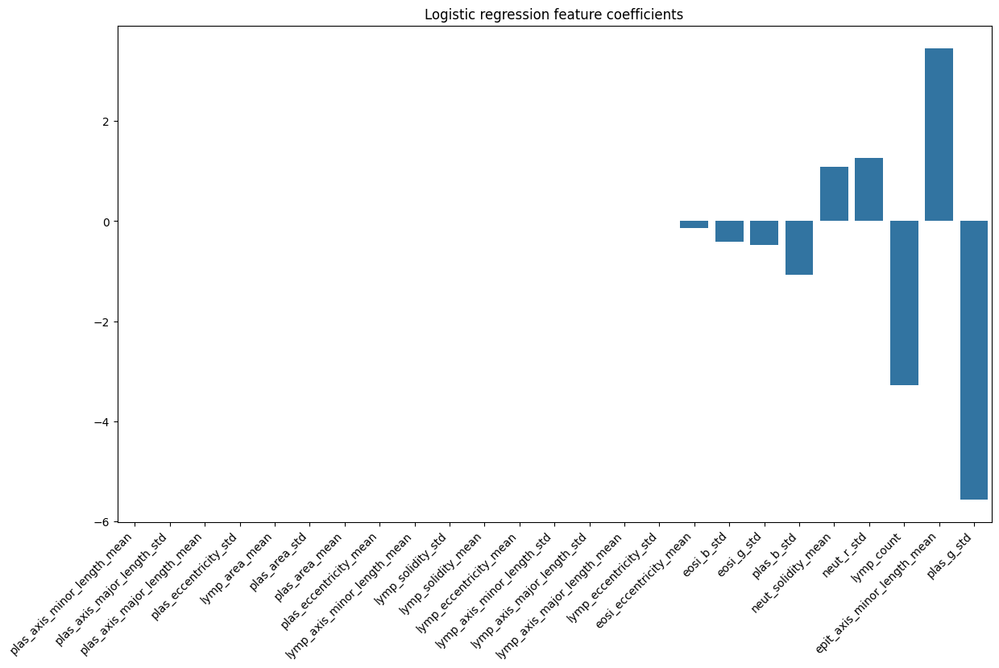

In [10]:
logistic_clf = hf.fit_and_evaluate_logistic_model(df_train, df_val, df_test, target=target, penalty='l1', C=1, solver='saga', scaling='minmax')
hf.plot_logistic_feature_weights(logistic_clf, df_train, target=target, n=25)

In [11]:
# Define parameter grid
param_grid = {'n_estimators': [50, 100, 150], 'max_depth': [1, 2, 3, 4, 5, 6, 7]}

# Execute grid search
gs = GridSearchCV(RandomForestClassifier(random_state=42), param_grid=param_grid, scoring=hf.default_eval_metrics, refit='AUROC', cv=5,
                  n_jobs = 2,
                  return_train_score=True)

X_train, X_val, X_test, y_train, y_val, y_test = hf.get_features_and_target(df_train, df_val, df_test, target=target)
gs.fit(X_train, y_train)

print("Best parameters: " + str(gs.best_params_))
grid_search_clf = gs.best_estimator_

Best parameters: {'max_depth': 2, 'n_estimators': 50}


In [12]:
print("Grid search classifier:")
print("VALIDATION SET")

hf.evaluate_trained_clf(grid_search_clf, X_val, y_val)
print("\nTEST SET")
hf.evaluate_trained_clf(grid_search_clf, X_test, y_test)

Grid search classifier:
VALIDATION SET
AUROC: 0.971292
avg_precision: 0.987368
Accuracy: 0.966667
F1-score: 0.972973
[[11  0]
 [ 1 18]]

TEST SET
AUROC: 0.985714
avg_precision: 0.990909
Accuracy: 0.941176
F1-score: 0.947368
[[7 0]
 [1 9]]


/tmp/ipykernel_23094/167939011.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation = 45, ha = 'right')


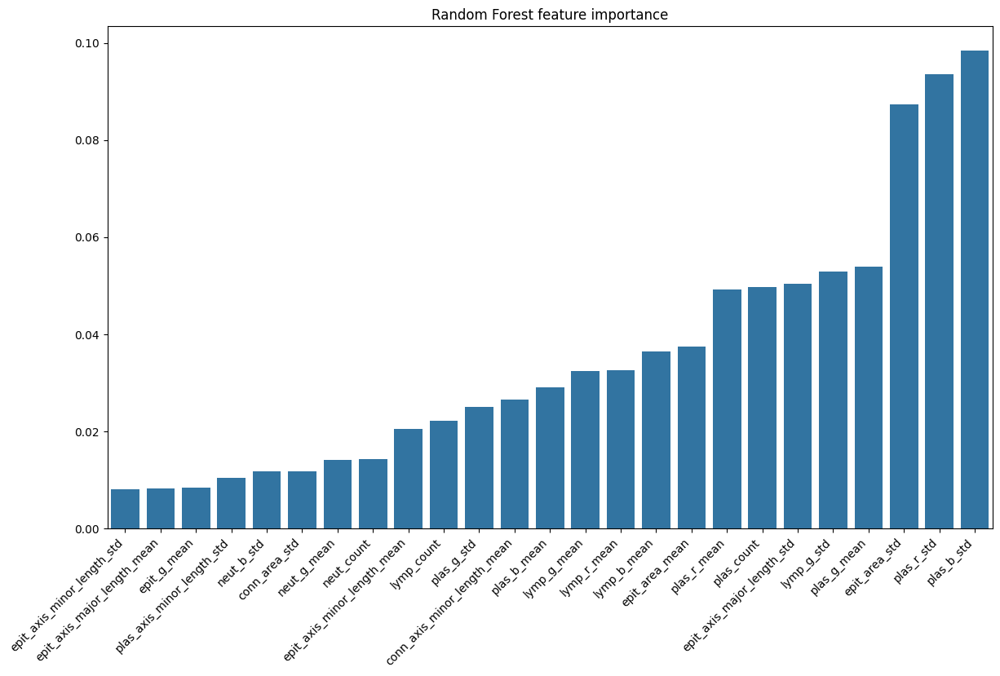

In [13]:
coefs = grid_search_clf.feature_importances_
feats = [x for _, x in sorted(zip(coefs, hf.get_feature_columns(df.iloc[:,4:], target='malignant')))]

fig, ax = plt.subplots(figsize=(14, 8))
sns.barplot(x=feats[-25:], y=sorted(coefs)[-25:])
ax.set_title("Random Forest feature importance")
ax.set_xticklabels(ax.get_xticklabels(), rotation = 45, ha = 'right')
plt.show()

## Instace Classification Simple Model
The approach will be different here. Features will be extracted at the instance level. There are 299,710. Of these, 162,488 or 54.22% are epithelial

In [405]:
df.to_csv('/storage/homefs/jg23p152/project/Data/data_info.csv')